# **Elections Analysis**

<div dir="rtl">

בדו"ח זה אערוך ניתוח סטטיסטי עבור מפלגת **כחול לבן** לפי מערכות הבחירות הבאות:
ספטמבר 2019
אפריל 2019
מרץ 2020

השתמשתי בנתונים לפי ערים ולפי קלפיות, וכן בקובץ נתונים שמציג עבור על עיר בישראל את המדרג כלכלי-חברתי שלה.
</div>



---



# **Hide Code**

In [ ]:
#@title
from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)

Toggle code

# **Imports**

In [ ]:
from google.colab import files
import numpy as np 
import pandas as pd  
import io
import matplotlib.pyplot as plt
import seaborn as sn
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import cvxpy as cvx
from scipy.optimize import nnls


# **Load Data**

**2019a by cities**


In [ ]:
url ="https://raw.githubusercontent.com/OdedMous/ElectionsDataAnalysis/main/data/votes%20per%20city%202019a.csv"
df_cities_2019a_raw = pd.read_csv(url, encoding = 'iso-8859-8', index_col='שם ישוב')


In [ ]:
df_cities_2019a = df_cities_2019a_raw.drop(['סמל ישוב', 'בזב', 'מצביעים', 'פסולים', 'כשרים'], axis=1)


**2019a by ballots**

In [ ]:
url ="https://raw.githubusercontent.com/OdedMous/ElectionsDataAnalysis/main/data/votes%20per%20ballot%202019a.csv"
df_ballots_2019a_raw = pd.read_csv(url, encoding = 'iso-8859-8', index_col='שם ישוב')


In [ ]:
df_ballots_2019a = df_ballots_2019a_raw.drop(['סמל ישוב', 'מספר קלפי',  'בזב', 'מצביעים', 'פסולים', 'כשרים'], axis=1)


**2019b by cities**

In [ ]:
url ="https://raw.githubusercontent.com/OdedMous/ElectionsDataAnalysis/main/data/votes%20per%20city%202019b.csv"
df_cities_2019b_raw = pd.read_csv(url, encoding = 'iso-8859-8', index_col='שם ישוב')


In [ ]:
df_cities_2019b = df_cities_2019b_raw.drop(['סמל ועדה','סמל ישוב', 'בזב', 'מצביעים', 'פסולים', 'כשרים'], axis=1)


**2019b by ballots**

In [ ]:
url ="https://raw.githubusercontent.com/OdedMous/ElectionsDataAnalysis/main/data/votes%20per%20ballot%202019b.csv"
df_ballots_2019b_raw = pd.read_csv(url, encoding = 'iso-8859-8', index_col='שם ישוב')
df_ballots_2019b_raw = df_ballots_2019b_raw.rename(columns={'קלפי': 'מספר קלפי'})


In [ ]:
df_ballots_2019b = df_ballots_2019b_raw.drop(['סמל ועדה', 'ברזל', 'סמל ישוב', 'מספר קלפי', 'ריכוז', 'שופט', 'בזב', 'מצביעים', 'פסולים', 'כשרים'], axis=1)


**2020 by cities**

In [ ]:
url ="https://raw.githubusercontent.com/OdedMous/ElectionsDataAnalysis/main/data/votes%20per%20city%202020.csv"
df_cities_2020_raw = pd.read_csv(url, encoding = 'iso-8859-8', index_col='שם ישוב')


In [ ]:
df_cities_2020 = df_cities_2020_raw.drop(['סמל ועדה', 'סמל ישוב', 'בזב', 'מצביעים', 'פסולים', 'כשרים','Unnamed: 37' ], axis=1)


**2020 by ballots**

In [ ]:
url = "https://raw.githubusercontent.com/OdedMous/ElectionsDataAnalysis/main/data/vote_per_kalpi_2020.csv"
df_ballots_2020_raw = pd.read_csv(url, encoding = 'iso-8859-8', index_col='שם ישוב')
df_ballots_2020_raw = df_ballots_2020_raw.rename(columns={'קלפי': 'מספר קלפי'})


In [ ]:
df_ballots_2020 = df_ballots_2020_raw.drop(['סמל ועדה', 'ברזל', 'סמל ישוב', 'מספר קלפי', 'ריכוז', 'שופט', 'בזב', 'מצביעים', 'פסולים', 'כשרים'], axis=1)
df_ballots_2020 = df_ballots_2020.drop('זץ', axis=1)


**Parties names**

In [ ]:
parties_dict_2019a ={'אמת' : "עבודה", 'ג' : "יהדות התורה", 'דעם'  : "רעם בלד", 'ום'  : "חדש תעל", 'טב'  : "איחוד מפלגות הימין",
 'ל'  : "ישראל ביתנו", 'מחל'  : "הליכוד", 'מרצ'  : "מרצ", 'פה'  : "כחול לבן", 'שס'  : "שס",  'כ'  : "כולנו",  'נ'  : "ימין חדש",  'ז'  : "זהות",  'נר'  : "גשר"}

parties_dict_2019b ={'אמת' : "עבודה גשר", 'ג' : "יהדות התורה", 'ודעם'  : "הרשימה המשותפת", 'טב'  : "ימינה", 'כף'  : "עוצמה יהודית",
 'ל'  : "ישראל ביתנו", 'מחל'  : "הליכוד", 'מרצ'  : "המחנה הדמוקרטי", 'פה'  : "כחול לבן", 'שס'  : "שס"}

parties_dict_2020 ={'אמת' : "עבודה גשר מרצ", 'ג' : "יהדות התורה", 'ודעם'  : "הרשימה המשותפת", 'טב'  : "ימינה", 'נץ'  : "עוצמה יהודית",
 'ל'  : "ישראל ביתנו", 'מחל'  : "הליכוד",  'פה'  : "כחול לבן", 'שס'  : "שס"}

**df_hevrati_calcali**

In [ ]:
#@title
url = "https://raw.githubusercontent.com/OdedMous/ElectionsDataAnalysis/main/data/eshkol_hevrati_calcali.xlsx"
df_hevrati_calcali = pd.read_excel(url)


## **B)**

<div dir="rtl">

בסעיף זה נסביר כיצד השתנו הירכבי המפלגות בין שלוש מערכות הבחירות.
נשים לב שכחול לבן לא השתנתה בהרכב המפלגה במהלך 3 מערכות הבחירות (מפלגת יש עתיד התפרקה מכחול לבן רק עם הקמת הממשלה לאחר מערכת הבחירות השלישית ).

</div>

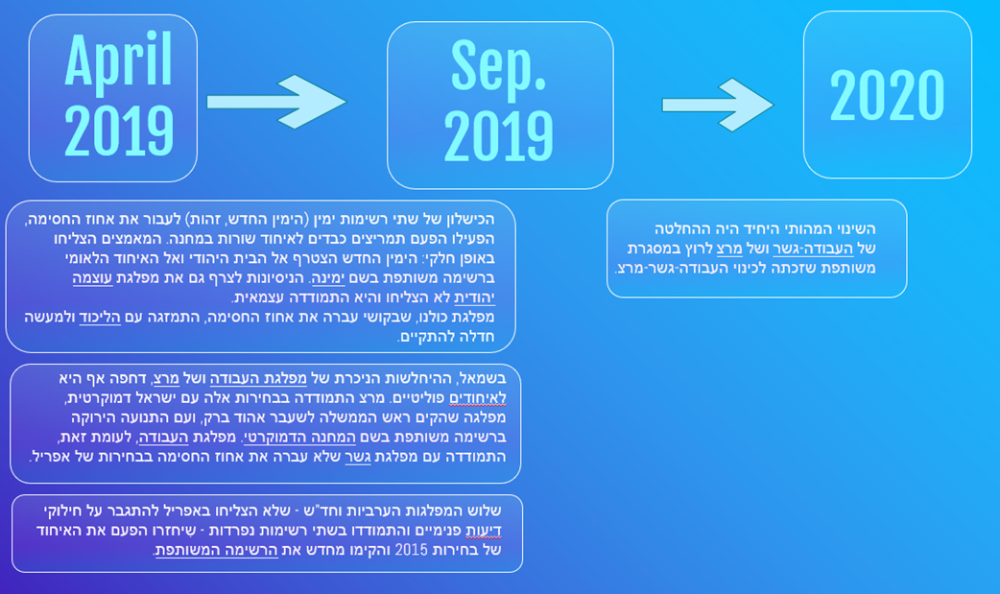

## **C)**

<div dir="rtl">

בסעיף זה אנסה לבדוק כיצד תמונת ההצבעות תשנה אם מניחים שכל בעלי זכות הבחירה בארץ היו מצביעים בבחירות.

לשם כך אשתמש במודל הבא שמתואר בשקף למטה.

</div>

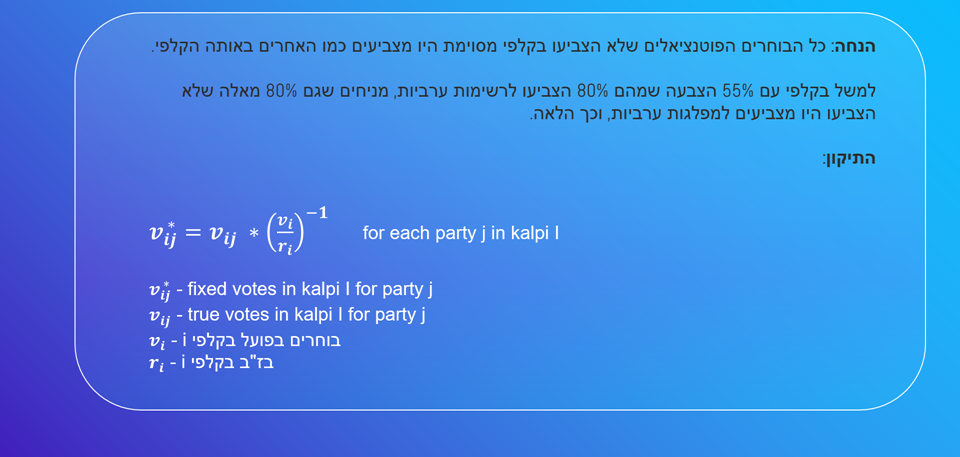

In [ ]:
def fix_votes(raw_df, df):
    v = raw_df['כשרים'].div(raw_df['בזב'])
    df_fix = df.div(v , axis = 'rows')

    fixed_votes = df_fix.sum().div(df_fix.sum().sum()).sort_values(ascending=False)
    true_votes = df.sum().div(df.sum().sum()).sort_values(ascending=False)

    return true_votes['פה'], fixed_votes['פה'], df_fix


In [ ]:
true_vote_2019a, fixed_votes_2019a, df_fix_2019a = fix_votes(df_ballots_2019a_raw, df_ballots_2019a)
true_vote_2019b, fixed_votes_2019b, df_fix_2019b = fix_votes(df_ballots_2019b_raw, df_ballots_2019b)
true_vote_2020, fixed_votes_2020, df_fix_2020 = fix_votes(df_ballots_2020_raw, df_ballots_2020)


**Turnout Estimation - "Kachol Lavan"**

<div dir="rtl">

כאן אציג מהו אחוז ההצבעה המשוער בקרב הבוחרים הפוטנציאלים של מפלגת כחול-לבן.


</div>


In [ ]:
estimate_turnout_2019a = df_ballots_2019a.sum() / df_fix_2019a.sum()
estimate_turnout_2019b = df_ballots_2019b.sum() / df_fix_2019b.sum()
estimate_turnout_2020 = df_ballots_2020.sum() / df_fix_2020.sum()

# print("Khaol Lavan (%):")
# print(estimate_turnout_2019a["פה"]*100)
# print(estimate_turnout_2019b["פה"]*100)
# print(estimate_turnout_2020["פה"]*100)

# print("Avgerge(%) :")
# print(estimate_turnout_2019a.sum() / len(estimate_turnout_2019a)*100)
# print(estimate_turnout_2019b.sum() / len(estimate_turnout_2019b)*100)
# print(estimate_turnout_2020.sum() / len(estimate_turnout_2020)*100)



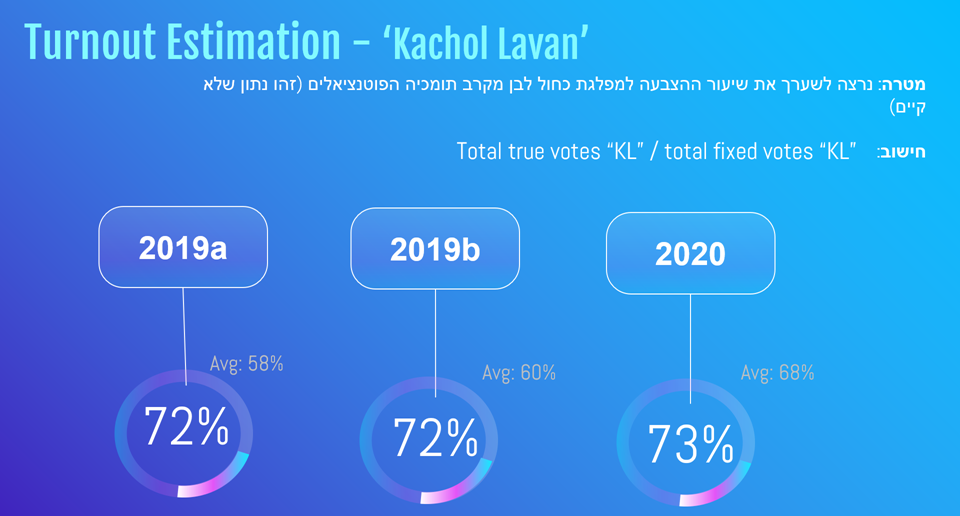

<div dir="rtl">

בעיגולים מופיעים אחוז ההצבעה המשוער של תומכי כחול להן הפוטנציאלים. ליד כל עיגול מופיע אחוז ההצבעה הכללי.

ניתן לראות ששיעור ההצבעה המשוער של תומכי כחול לבן גבוה מהממוצע בכל שלוש מערכות הבחירות.

.</div>

**Vote Percentage Estimation - Kachol Lavan**

<div dir="rtl">

כאן אציג כיצד אחוז ההצבעה לכחול-לבן היה משתנה בהנחה שכל בעלי זכות הבחירה היו מצביעים.


</div>




In [ ]:


branches = ['elections 2019a', 'elections 2019b', 'elections 2020']
true_votes = np.array([true_vote_2019a, true_vote_2019b, true_vote_2020])*100
fixed_votes = np.array([fixed_votes_2019a, fixed_votes_2019b, fixed_votes_2020])*100

trace1 = go.Bar(x=branches, y=true_votes, name='true_votes')
trace2 = go.Bar(x=branches, y=fixed_votes, name='fixed_votes')
data = [trace1, trace2]

layout = go.Layout(barmode = 'group')
fig = go.Figure(data = data, layout = layout)
fig.update_layout(template='plotly_dark', title="True & Fixed Vote Percentage for 'Khaol Lavan'")
fig.show()

<div dir="rtl">

ניתן לראות שבשלושת המערכות כחול-לבן יורדת באחוז ההצבעות אם מניחים שכל בעלי זכות הבחירה בארץ מצביעים.

זה נובע מכך שמספר ההצבעות הכללי עלה ומפלגות אחרות קיבלו יותר קולות, ולכן שמנרמלים את מספר הקולות שקיבלה כל מפלגה מקבלים את התוצאה הזו.

.</div>

## **D)**


  <div dir="rtl">

בסעיף זה נראה כיצד שכיחות ההצבעה למפלגה משתנה בין ישובים לפי המדרג כלכלי חברתי של כל ישוב.

</div>

In [ ]:
# subplots for each election by socio Eshkol
def votes_percent_per_socio(dfs_list):

    fig, ax = plt.subplots(1, 3, figsize=(20,10))
    n = 10 #number of ranks
    names_rev = ["2019a", "2019b", "2020"]

    for i in range(3):   

        ax[i].bar(np.arange(n), dfs_list[i].loc["פה"])
        ax[i].set_title(names_rev[i], fontsize=14)

    y_perc = [0, 0.1, 0.2, 0.3, 0.4, 0.5,0.6,0.7,0.8,0.9,1]
    for ax in ax.flat:
        ax.set_xticklabels(np.arange(10)+1, fontsize=12)
        ax.xaxis.set_ticks(np.arange(0, 10, 1))
        ax.set_ylabel('voting percent', fontsize=12)
        ax.set_xlabel('social Eshkol', fontsize=12)
        ax.set_yticklabels(y_perc, fontsize=12)
   
    fig.tight_layout() 
    plt.show()
    return fig, ax


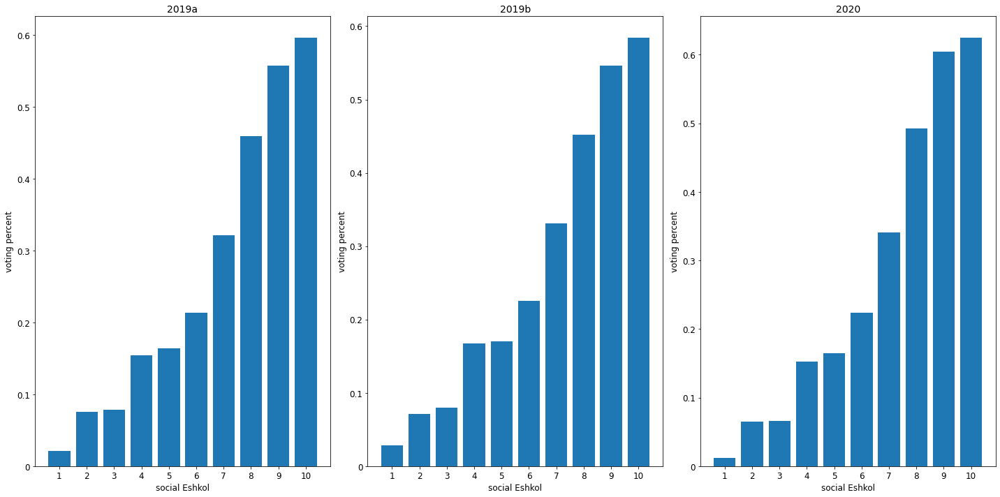

(<Figure size 1440x720 with 3 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f9d5877fe10>)

In [ ]:

def cal_p_df(df_raw, parties_dict):

    merged_df = df_hevrati_calcali.merge(df_raw, left_on='set_code', right_on='סמל ישוב', how='inner')
    #Compute voting frequencies for each party and each eshkol:
    names = parties_dict.keys()
    p_dict = {name: list() for name in names}

    for eshkol in range(10):
        # Find all cities in current eshkol. You can use np.where 
        rel_cities = np.where(merged_df['eco_level'].values.astype('float') == eshkol+1)[0]
        # Compute parties frequencies for cities in current eshkol
        p = merged_df.iloc[rel_cities][names].sum().div(merged_df.iloc[rel_cities][names].sum().sum())

        parties = p.keys()
        for i in range(len(names)):
          p_dict[parties[i]].append(p[i])

    p_df = pd.DataFrame(p_dict, index=list(range(1, 11)))

    p_df_t = pd.DataFrame(np.array(p_df).T, index=p_df.columns)
    return p_df_t

p_df_2019a = cal_p_df(df_cities_2019a_raw, parties_dict_2019a)
p_df_2019b = cal_p_df(df_cities_2019b_raw, parties_dict_2019b)
p_df_2020 = cal_p_df(df_cities_2020_raw, parties_dict_2020)

votes_percent_per_socio([p_df_2019a, p_df_2019b, p_df_2020])



<div dir="rtl">

הסבר התוצאות: למשל במערכת בחירות 2019, 60% מכלל המצביעים בישובים השייכים לאשכול כלכלי-חברתי 10 הצביעו לכחול לבן.

ניתן לראות שכחול לבן חזקה בישובים עם מדרג כלכלי-חברתי גבוה. למשל ניתן לראות שב-3 מערכות הבחירות כחול לבן זכתה לתמיכה של למעלה מ-50% בישובים השייכים לאשכול כלכלי-חברתי 9 ו-10.





</div>

## **E)**

<div dir="rtl">

בסעיף זה אשתמש בקובץ הקלפיות של בחירות 2020. 

אתייחס למפלגות כפיצ'רים ולקלפיות כדגימות, ואוריד את המימד של הנתונים למימד 2 כך שאוכל להציג את הנתונים בתרשים דו מימדי.

כל נקודה במרחב הדו מימדי מייצגת קלפי מסויימת, ובכל פעם אצבע את הנקודות לפי שיטה אחרת כדי לקבל תובנות על הקלפיות בקשר למפלגת כחול לבן.

.</div>

**PCA functions**

In [ ]:
def do_pca(data_table, n_components):
  """
  Note: data_table.shape = (samples_num, features_num)
  """
  pca = PCA(n_components=n_components) 
  X_pca = pca.fit_transform(data_table) 
  return X_pca

In [ ]:
def show_pca_space(X_pca, name_features, color_name, color_col, name_col, show_names=False):
  temp_df = px.data.tips()

  temp_df = pd.DataFrame(X_pca).rename(columns={0:"PCA1", 1:"PCA2"})
  temp_df[name_col] = name_features
  temp_df[color_name] = list(color_col)

  if show_names:
    fig = px.scatter(temp_df, x="PCA1", y="PCA2", color=color_name, text=name_col)

  else:
    fig = px.scatter(temp_df, x="PCA1", y="PCA2", color=color_name)

  fig.update_traces(textposition='top center')
  fig.update_layout(title_text='PCA space', title_x=0.5, template='plotly_dark')

  fig.show()



**PCA 2020**

<div dir="rtl">

בתרשים למטה צבע כל נקודה נקבע לפי אחוז ההצבעה בקלפי למפלגת כחול לבן.

ניתן לראות שככל שהצבע "מתחמם" ונהיה צהוב כך עולה התמיכה בקלפי בכחול לבן.

.</div>

In [ ]:
df_kalpi_normilized = df_ballots_2020.div(df_ballots_2020.sum(axis=1), axis=0) # L1 norm
# df_kalpi_normilized = df_ballots_2020.div(np.sqrt(np.square(df_ballots_2020).sum(axis=0)), axis=1) # L2 norm (euclidean norm)

X_pca_2020 = do_pca(data_table=df_kalpi_normilized, n_components=2)
show_pca_space(X_pca_2020, name_features=df_kalpi_normilized.index,color_name='Voting Rate', color_col=df_kalpi_normilized['פה'] , name_col="kalpi")


<div dir="rtl">

כעת כדי להבין את המרחב החדש שהטלנו עליו את הנתונים (כך שאוכל להבין מה מאפיין את הקלפיות שיש בהן תמיכה רבה בכחול לבן, או לחלופין - מה מאפיין את הקלפיות שיש בהן תמיכה נמוכה בכחול לבן), אצבע את הנקודות בשיטות אחרות
.</div>

**Color by Clustering**

<div dir="rtl">

כאן ביצעתי clustering לנתונים (באמצעות K-means) ל-5 קבוצות.

אני משתמש בשיטה זו כדי שאוכל להתמקד בקבוצות מסויימות של קלפיות וכך אולי אוכל לזהות מאפיינים משותפים שיש לקלפיות אלה.

.</div>

In [ ]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(X_pca_2020)

# clusters_colors = pd.DataFrame(kmeans.labels_.astype( dtype=pd.Int64Dtype))
show_pca_space(X_pca_2020, name_features=df_kalpi_normilized.index,color_name='Cluster', color_col=kmeans.labels_ , name_col="kalpi")


<div dir="rtl">

לאחר שהסתכלתי על מיקום הקלפיות (ראו תרשים למטה), הצלחתי לזהות שבקלאסטר הצהוב יש הרבה קלפיות ששיכות למגזר החרדי, ובקלאסטר הורוד יש הרבה קלפיות ששייכות למגזר הערבי.
</div>

In [ ]:
show_pca_space(X_pca_2020, name_features=df_kalpi_normilized.index,color_name='Voting Rate', color_col=df_kalpi_normilized['פה'] , name_col="kalpi", show_names=True)


**Color by party**

<div dir="rtl">

כאן צבעתי את המרחב לפי אחוז התמיכה בכל אחת מ-8 המפלגות הגדולות.
</div>

In [ ]:

def show_pca_by_party(X_pca, df_kalpi_normilized):
    fig = make_subplots(rows=2, cols=4, subplot_titles=("ימינה", "ישראל ביתנו", "הליכוד", "שס", "יהדות התורה", "כחול לבן", "עבודה גשר מרץ", "הרשימה המשותפת"))
    col_index = 0
    row_index = 1

    temp_df = px.data.tips()
    temp_df = pd.DataFrame(X_pca).rename(columns={0:"PCA1", 1:"PCA2"})

    for party in  "טב ל מחל שס ג פה אמת ודעם".split():
    
      if col_index == 0:
        legend_display = True
      else:
        legend_display = False

      temp_df["color"] = list(df_kalpi_normilized[party])
      fig.add_trace(go.Scatter(x=temp_df["PCA1"], y=temp_df["PCA2"],mode='markers', name='', marker_color=temp_df["color"], showlegend=False, legendgroup='group1'), row=row_index, col=(col_index%4)+1)
        
      if col_index == 3:
        row_index = 2
      col_index+=1

    fig.update_layout(template='plotly_dark', showlegend=True)
    fig.show()

show_pca_by_party(X_pca_2020, df_kalpi_normilized)

<div dir="rtl">

ניתן לראות למשל שהמפלגה המשותפת זכתה לתמיכה רבה בקלפיות שהגדרנו מקודם כקלפיות ששייכות למגזר הערבי.


</div>

**Color by socio-economic class**

<div dir="rtl">

כאן צבעתי כל קלפי לפי המדרג כלכלי-חברתי של הישוב בו היא נמצאת.
</div>

In [ ]:
def show_pca_by_eshkol(X_pca, name_features, name_col, show_names):
  temp_df = px.data.tips()

  temp_df = pd.DataFrame(X_pca).rename(columns={0:"PCA1", 1:"PCA2"})
  temp_df[name_col] = name_features
  joined_table = temp_df.merge(df_hevrati_calcali, left_on='kalpi', right_on='name', how='inner')[['PCA1', 'PCA2', 'kalpi', 'eco_level']]

  if show_names:
    fig = px.scatter(joined_table, x="PCA1", y="PCA2", color='eco_level',text=name_col)
  else:
    fig = px.scatter(joined_table, x="PCA1", y="PCA2", color='eco_level')

  fig.update_traces(textposition='top center')
  fig.update_layout(title_text='PCA space', title_x=0.5, template='plotly_dark')
  fig.show()



show_pca_by_eshkol(X_pca_2020, name_features=df_kalpi_normilized.index,name_col="kalpi", show_names=False)

<div dir="rtl">

ניתן לראות שבאופן כללי ככל שעולים בציר השני כך עולה המדרג כלכלי-חברתי של הקלפיות.

</div>

<div dir="rtl">

בתרשים למטה סיכמתי את התובנות שהגעתי אליהן בקשר למרחב.

בנוסף צבעתי כל נקודה לפי אחוז ההצבעה לכחול לבן באותה הקלפי.

ניתן לראות שככל לבן חזקה בקלפיות שממוקמות בישובים עם מדרג סוציו-אקונומי גבוה ובקלפיות שמזוהות עם השמאל.
לעומת זאת ניתן לראות כחול לבן חלשה במגזר הערבי ובמגזר החרדי.

</div>

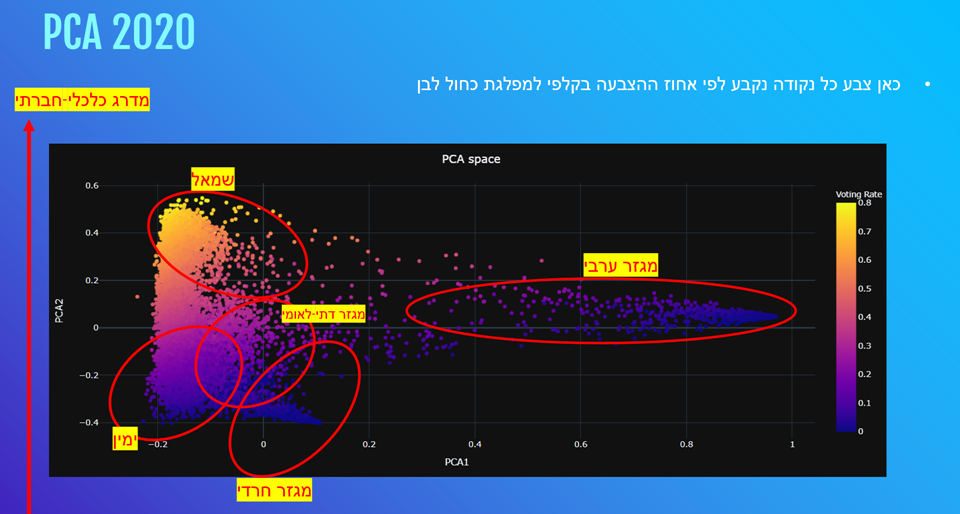

**Color by difference**

<div dir="rtl">

כאן ביצעתי הורדת מימד לנתונים של 2019a ולנתונים של 2020, ובכל פעם צבעתי את הקלפיות בהפרש של אחוז ההצבעה בין אותה מערכת בחירות למערכת בחירות הקודמת.

</div>

In [ ]:
def filer_dfs_by_common_ballots(df1_raw, df2_raw, df1, df2):
    
    # Intersection of ballots
    merged = df2_raw.merge(df1_raw, left_on=['סמל ישוב',  'מספר קלפי'], right_on=['סמל ישוב', 'מספר קלפי'], how='inner')

    # select only ballots which are common to both data frames
    df1_merged  = df1_raw[df1_raw.set_index(['סמל ישוב', 'מספר קלפי']).index.isin(merged.set_index(['סמל ישוב',  'מספר קלפי']).index)]
    df2_merged  = df2_raw[df2_raw.set_index(['סמל ישוב', 'מספר קלפי']).index.isin(merged.set_index(['סמל ישוב',  'מספר קלפי']).index)]

    # pick only parties columns
    df1_merged = df1_merged[df1.columns]
    df2_merged = df2_merged[df2.columns]

    return df1_merged, df2_merged

**2019a-2019b**

In [ ]:
common_ballots_2019a, common_ballots_2019b = filer_dfs_by_common_ballots(df_ballots_2019a_raw, df_ballots_2019b_raw, df_ballots_2019a, df_ballots_2019b)

# normilize each row (sample)
df_kalpi_normilized_2019a = common_ballots_2019a.div(common_ballots_2019a.sum(axis=1), axis=0).fillna(0)
df_kalpi_normilized_2019b = common_ballots_2019b.div(common_ballots_2019b.sum(axis=1), axis=0).fillna(0)

# Do PCA
X_pca_2019b = do_pca(data_table=df_kalpi_normilized_2019b, n_components=2)

# calculate differnece in voting for "khaol lavan" between 2019a-2019b
diff = df_kalpi_normilized_2019b.reset_index()['פה'] - df_kalpi_normilized_2019a.reset_index()['פה']

show_pca_space(X_pca_2019b, name_features=df_kalpi_normilized_2019b.index,color_name='Difference', color_col=diff , name_col="kalpi")


**2019b-2020**

In [ ]:
# in both dataframes, include only ballots which are common to both dataframes
common_ballots_2019b, common_ballots_2020 = filer_dfs_by_common_ballots(df_ballots_2019b_raw, df_ballots_2020_raw, df_ballots_2019b, df_ballots_2020)

# normilize each row (sample)
df_kalpi_normilized_2019b = common_ballots_2019b.div(common_ballots_2019b.sum(axis=1), axis=0).fillna(0)
df_kalpi_normilized_2020 = common_ballots_2020.div(common_ballots_2020.sum(axis=1), axis=0).fillna(0)

# Do PCA
X_pca_2020 = do_pca(data_table=df_kalpi_normilized_2020, n_components=2)

# calculate differnece in voting for "Khaol-Lavan" between 2019b-2020
diff = df_kalpi_normilized_2020.reset_index()['פה'] - df_kalpi_normilized_2019b.reset_index()['פה']

show_pca_space(X_pca_2020, name_features=df_kalpi_normilized_2020.index,color_name='Difference', color_col=diff , name_col="kalpi")

  <div dir="rtl">

  פירוש הצבעים:

צהוב - התחזקה

ורוד - ללא שינוי

כחול - נחלשה


ניתן לראות ב-2 התרשימים התחזקות בקלפיות שכבר מזוהות עם מפלגת כחול לבן. 

  בתרשים השני ניתן לראות שבישוב כסרא-סמיע חלה ירידה של כ-50% בהצבעה לכחול לבן. בחלק האחרון של הדו"ח אתייחס לנתון הזה. 

.</div>

**Difference 2019b-2020 in Haifa**

  <div dir="rtl">

כדי להבין באופן יותר ספציפי באילו קלפיות ב2020 כחול לבן התחזקה/נחלשה לעומת 2019a, התמקדתי רק בקלפיות שנמצאות בעיר חיפה.

בחרתי דווקא את העיר חיפה מכייון שזו עיר מגוונת מבחינת האוכלוסיה.

ניתן לראות שאחוז ההצבעה עלה בקלפיות שכבר היו מזהות בתמיכה הרבה שלהן בכחול לבן
לעומת זאת במגזר החרדי/ערבי יש ירידה קלה.
</div>

In [ ]:

haifa_indxs = pd.Index((df_kalpi_normilized_2020.index)).get_loc('חיפה')
show_pca_space(X_pca_2020[haifa_indxs], name_features=df_kalpi_normilized_2020.index[haifa_indxs],color_name='Difference', color_col=diff[haifa_indxs] , name_col="kalpi")

## **F+G)**

  <div dir="rtl">

בסעיפים אלו אציג הערכה של מעברי קולות ממערכת הבחירות הראשונה לשנייה, ומהשנייה לשלישית.

אשתמש במודל מסויים שמתואר בשקף הבא:

</div>

**Model**

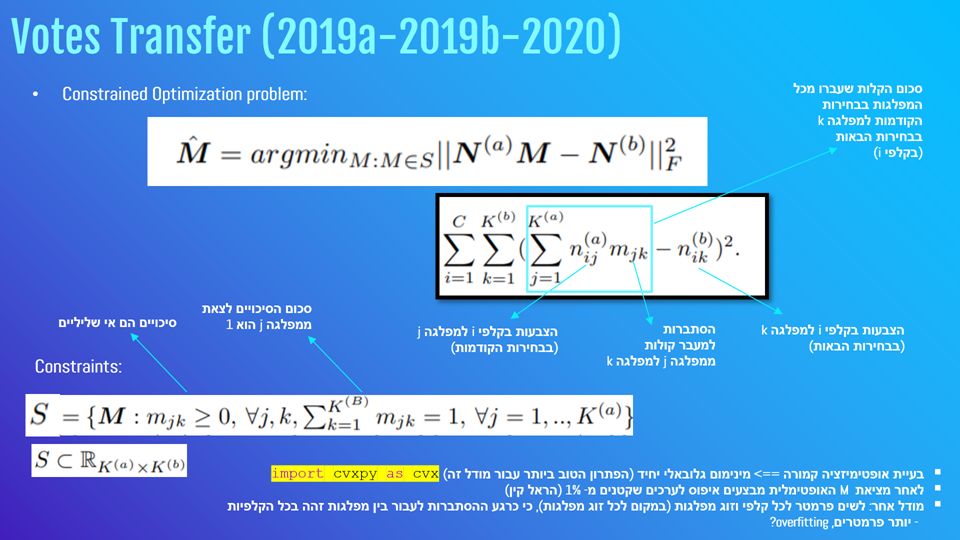

  <div dir="rtl">

נשים לב שמודל זה מניח שההסתברות לעבור ממפלגה מסויימת בבחירות קודמות למפלגה אחרת בבחירות הבאות זהה בכל הקלפיות.

הנחה זו עוזרת לנו מהבחינה שיש לנו רק k(A)xK(B) פרמטרים, במקום CxK(A)xK(B), כאשר C מייצג את מספר הקלפיות ו-K את מספר המפלגות במערכת בחירות מסויימת.

היינו רוצים להשתמש במודל השני משום שהוא הכי מדויק, אבל מצד שני למודל כזה יש הרבה פרמטרים (ואולי יותר מדי כך שמערכת המשוואות תהיה בלתי פתירה גם באופן מקורב).
לכן ישנם מודלים אחרים, למשל מודל שמניח שההסתברות לעבור ממפלגה למפלגה אחרת קבוע לפי האשכול הכלכלי-חברתי של הקלפיות, וכו'.

עקב קוצר בזמן, אני אשתמש פשוט במודל שהצגתי בשקף.
</div>

In [ ]:
DESTINATION_PARTY_COLORS = [
    'rgba(31, 119, 180, 0.4)',
    'rgba(255, 127, 14, 0.4)',
    'rgba(44, 160, 44, 0.4)',
    'rgba(214, 39, 40, 0.4)',
    'rgba(148, 103, 189, 0.4)',
    'rgba(140, 86, 75, 0.4)',
    'rgba(227, 119, 194, 0.4)',
    'rgba(127, 127, 127, 0.4)',
    'rgba(188, 189, 34, 0.4)',
    'rgba(23, 190, 207, 0.4)',
    'rgba(0, 0 ,0 ,0.4)']

def adapt_df(df, parties, include_no_vote=False, ballot_number_field_name=None):
    df['ballot_id'] = df['סמל ישוב'].astype(str) + '__' + df[ballot_number_field_name].astype(str)
    df = df.set_index('ballot_id')
    eligible_voters = df['בזב']
    total_voters = df['מצביעים']
    df = df[parties]
    df = df.reindex(sorted(df.columns), axis=1)
    if include_no_vote:
        df['לא הצביע'] = eligible_voters - total_voters
    return df

def solve_transfer_coefficients(x_data, y_data, verbose):
    M = cvx.Variable([x_data.shape[1], y_data.shape[1]])
    constraints = [0 <= M, M <= 1, cvx.sum(M, axis=1) == 1]
    objective = cvx.Minimize(cvx.norm((x_data @ M) - y_data, 'fro'))
    prob = cvx.Problem(objective, constraints)
    prob.solve(solver='SCS', verbose=True)
    M = M.value

    if verbose:
        print(M.min())  # should be close to 0
        print(M.max())  # should be close to 1
        print(M.sum(axis=1).min())  # should be close to 1
        print(M.sum(axis=1).max())  # should be close to 1
    return M

def corr_heat_map(M, before_parties, after_parties, year_before, year_after):
    n_after = len(after_parties)
    n_before = len(before_parties)

    fig, ax = plt.subplots(figsize = (9,9))
    im = ax.imshow(M.T, cmap=plt.get_cmap('viridis'))

    ax.set_title("changes in voting preferences - M")
    ax.set_xticks(np.arange(n_after))
    ax.set_yticks(np.arange(n_before))
    # And to label them with the relevant parties names
    ax.set_xticklabels([n[::-1] for n in after_parties])
    ax.set_yticklabels([n[::-1] for n in before_parties])
    ax.set_xlabel(year_after)
    ax.set_ylabel(year_before)

    # Loop over data dimensions to create text annotations.
    for i in range(n_before):
        for j in range(n_after):
            text = ax.text(j, i, round(M.T[i, j], 3), ha="center", va="center", color="w")

    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('votes probability', rotation=-90, va="bottom")

    plt.show()




In [ ]:
b21 = df_ballots_2019a_raw
b22 = df_ballots_2019b_raw
b23 = df_ballots_2020_raw


parties21 = 'מחל פה שס ג ום אמת ל טב מרצ כ דעם נ ז נר'.split()
parties22 = 'פה מחל ודעם שס ל ג טב אמת מרצ כף'.split()
parties23 = 'מחל פה ודעם שס ג אמת ל טב'.split()

b21 = adapt_df(b21, parties21, include_no_vote=True, ballot_number_field_name='מספר קלפי')
b22 = adapt_df(b22, parties22, include_no_vote=True, ballot_number_field_name='מספר קלפי')
b23 = adapt_df(b23, parties23, include_no_vote=True, ballot_number_field_name='מספר קלפי')

u = pd.merge(b21, b22, how='inner', left_index=True, right_index=True)
u = pd.merge(u, b23, how='inner', left_index=True, right_index=True)
v21 = b21.loc[u.index].values
v22 = b22.loc[u.index].values
v23 = b23.loc[u.index].values


### method 3: use convex solver with constraints
M = solve_transfer_coefficients(v21, v22, True).T
M_2 = solve_transfer_coefficients(v22, v23, True).T


# wrongly_explained = np.sum(np.abs(b21.loc[u.index].values @ M.T - b22.loc[u.index].values))
# total_22 = b22.loc[u.index].values.sum()
# print('{:.4f}% of votes correctly explained'.format(100* (1. - (wrongly_explained / total_22))))

# print(M.sum(axis=0))
# print(M.sum(axis=1))

M[M<0.01] = 0.
M_2[M_2<0.01] = 0.

vote_movements = M * b21.sum(axis=0).values
vote_movements_2 = M_2 * b22.sum(axis=0).values

In [ ]:
def sankey(vote_movements,vote_movements_2, before_labels, after_labels, after_labels_2):
    source, target = np.meshgrid(np.arange(0, len(before_labels)),
                                 np.arange(len(before_labels), len(before_labels) + len(after_labels)))
    
    source_2, target_2 = np.meshgrid(np.arange(len(before_labels), len(before_labels) + len(after_labels)),
                                     np.arange(len(before_labels) + len(after_labels), len(before_labels) + len(after_labels) + len(after_labels_2)))

    source = list(source.flatten()) + list(source_2.flatten())
    target = list(target.flatten()) + list(target_2.flatten())

    before_labels = [parties_dict_2019a[party][::-1] if party in parties_dict_2019a  else 'לא הצביע'[::-1] for party in before_labels]
    after_labels = [parties_dict_2019b[party][::-1] if party in parties_dict_2019b  else 'לא הצביע'[::-1] for party in after_labels]
    after_labels_2 = [parties_dict_2020[party][::-1] if party in parties_dict_2020  else 'לא הצביע'[::-1] for party in after_labels_2]


    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=20,
            thickness=30,
            label=list(before_labels) + list(after_labels) + list(after_labels_2)
        ),
        link=dict(
            source=source,  # indices correspond to labels, eg A1, A2, A2, B1, ...
            target=target,
            value=list(vote_movements.flatten()) + list(vote_movements_2.flatten())
        ))])

    fig.update_layout(title_text="""
    ניתוח נדידת הקולות בין מערכות הבחירות לכנסת ה-21 וה-22 וה-23
    """,

                      font_size=16) #, template='plotly_dark')
    fig.show()



**Results**

 <div dir="rtl">

הערות:

* בכל מערכת בחירות כללתי רק את המפלגות הגדולות באותה מערכת

* הוספתי מפלגת "לא הצביעו"

* ההצגה היא של מספר הקולות שעברו ממפלגה למפלגה (ולא אחוז הקולות)




.</div>

In [ ]:
sankey(vote_movements, vote_movements_2,  b21.columns.values, b22.columns.values,  b23.columns.values)


 <div dir="rtl">

ניתן לראות שהתוצאות שהתקבלו הן הגיוניות:

ראשית אפשר לראות שעבור כל מפלגה רוב המצביעים נשארו בה גם בבחירות הבאות (למעט מפלגות שהתפרקו). שנית אפשר לראות שהמעברים בין המפלגות נעשים לרוב ע"פ חלוקה של מפלגות ימין, שמאל, מגזר ערבי ומגזר חרדי, כפי שהיינו מצפים.

כך למשל ניתן לראות שהמצביעים של מפלגת זהות עברו ממערכת הבחירות הראשונה למפלגות הבאות במערכת הבחירות השנייה: עוצמה יהודית, הליכוד, ישראל ביתינו, לא הצביעו.


</div>

**Focus on Kachol-Lavan**

 <div dir="rtl">

בתרשים למטה ניתן לראות מאילו מפלגות בבחירות 2019a עברו קולות לכחול לבן בבחירות 2019b, ואז אילו קולות עברו מכחול לבן בבחירות 2019b למפלגות השונות ב-2020.


</div>

In [ ]:
party_index_22 = b22.columns.get_loc("פה")
sankey(vote_movements[party_index_22], vote_movements_2.T[party_index_22], b21.columns.values, ["פה"], b23.columns.values)

 <div dir="rtl">

בתרשים למטה ניתן לראות לאילו מפלגות הקולות של כחול לבן עברו מ-2019a ל-2019b, ואז מאילו מפלגות ב-2019b עברו קולות לכחול לבן ב-2020.

</div>

In [ ]:
def sankey(vote_movements,vote_movements_2, before_labels, after_labels, after_labels_2):
    source, target = np.meshgrid(np.arange(0, len(before_labels)),
                                 np.arange(len(before_labels), len(before_labels) + len(after_labels)))
    
    
    source_2, target_2 = np.meshgrid(np.arange(len(before_labels), len(before_labels) + len(after_labels)),
                                     np.arange(len(before_labels) + len(after_labels), len(before_labels) + len(after_labels) + len(after_labels_2)))

    source = list(source.flatten()) + list(source_2.flatten())
    target = list(target.flatten()) + list(target_2.flatten())

    before_labels = [parties_dict_2019a[party][::-1] if party in parties_dict_2019a  else 'לא הצביע'[::-1] for party in before_labels]
    after_labels = [parties_dict_2019b[party][::-1] if party in parties_dict_2019b  else 'לא הצביע'[::-1] for party in after_labels]
    after_labels_2 = [parties_dict_2020[party][::-1] if party in parties_dict_2020  else 'לא הצביע'[::-1] for party in after_labels_2]

    fig = go.Figure(data=[go.Sankey( arrangement = "snap",
        node={
            "pad":10,
            "thickness":30,
            "label":list(before_labels) + list(after_labels) + list(after_labels_2),
             "x": [0.1] * len(list(before_labels)) + [0.4] * len(list(after_labels)) + [0.7] * len(list(after_labels_2)),
             "y": [0.2] * len(list(before_labels)) +[0.1, 0.2, 0.3, 0.4] + [0.2] * len(list(after_labels_2))
        },
        link=dict(
            source=source,  # indices correspond to labels, eg A1, A2, A2, B1, ...
            target=target,
            value=list(vote_movements.flatten()) + list(vote_movements_2.flatten())
        ))])

    fig.update_layout(title_text="""
    ניתוח נדידת הקולות בין מערכות הבחירות לכנסת ה-21 וה-22 וה-23
    """,

                      font_size=16) #, template='plotly_dark')
    fig.show()

    

party_index_21 = b21.columns.get_loc("פה")
party_index_23 = b23.columns.get_loc("פה")

sankey(vote_movements.T[party_index_21], vote_movements_2[party_index_23], ["פה"], b22.columns.values, ["פה"])




## **H)**

  <div dir="rtl">

בסעיף זה ניסיתי לאתר קלפיות חשודות במערכת הבחירות 2020.

השיטה: חישבתי את ההפרשים באחוזי ההצבעה לכחול-לבן בין 2020 ו-2019a 
(לפי קלפיות). בחרתי להציג את 20 הקלפיות עם ההפרשים הגדולים ביותר בערך מוחלט, ופיצלתי את ההצגה לפי הפרש חיובי והפרש שלילי.

</div>

In [ ]:
# in both dataframes, include only ballots which are common to both dataframes
common_ballots_2019b, common_ballots_2020 = filer_dfs_by_common_ballots(df_ballots_2019b_raw, df_ballots_2020_raw, df_ballots_2019b, df_ballots_2020)


parties22 = "נץ ודעם אמת פה ג שס מחל ל טב".split()
parties23 = "נץ ודעם אמת פה ג שס מחל ל טב".split()

common_ballots_2019b['אמת'] +=  list(common_ballots_2019b["מרצ"])
common_ballots_2019b = common_ballots_2019b[parties22]

common_ballots_2020 = common_ballots_2020[parties23]

# normilize each row (sample)
df_kalpi_normilized_2019b = common_ballots_2019b.div(common_ballots_2019b.sum(axis=1), axis=0).fillna(0)
df_kalpi_normilized_2020 = common_ballots_2020.div(common_ballots_2020.sum(axis=1), axis=0).fillna(0)


In [ ]:
# calculate differnece in voting for "Khaol-Lavan" between 2019b-2020
diff = df_kalpi_normilized_2020.reset_index()['פה'] - df_kalpi_normilized_2019b.reset_index()['פה']
diff = np.array(list(diff))

max_indxs = diff.argsort()[-10:][::-1]
values_2019b = df_kalpi_normilized_2019b.iloc[max_indxs]['פה']
values_2020 = df_kalpi_normilized_2020.iloc[max_indxs]['פה']

In [ ]:
# calculate ooposite differnece in voting for "Khaol-Lavan" between 2019b-2020
diff2 =  df_kalpi_normilized_2020.reset_index()['פה']  - df_kalpi_normilized_2019b.reset_index()['פה'] 
diff2 = np.array(list(diff2))

min_indxs = np.argsort(diff2)[:10] 
values_2019b_2 = df_kalpi_normilized_2019b.iloc[min_indxs]['פה']
values_2020_2 = df_kalpi_normilized_2020.iloc[min_indxs]['פה']

In [ ]:
def plot_bars(values1, values2, year1, year2):
    width = 0.3  # set column width 
    n = len(list(values1))  # number of kalpies


    rev_names = [name[::-1] for name in list(values2.index)]
    fig, ax = plt.subplots()  

    bar_1 = ax.bar(np.arange(n), list(values1), width, color='#FF5733')
    bar_2 = ax.bar(np.arange(n)+width, list(values2), width, color='#33ADFF', align='center', alpha=0.4, ecolor='black', capsize=10)


    ax.set_ylabel('Votes Percentage')
    ax.set_title('')
    ax.set_xticks(np.arange(n))
    ax.set_xticklabels(rev_names, rotation='vertical')
    plt.legend([ bar_1[0], bar_2[0]], [year1, year2], **{'loc':'upper right', 'fontsize': 'medium'})
    plt.show()



 <div dir="rtl">

בתרשים זה מוצגות קלפיות בהן אחוז ההצבעה לכחול לבן גבוה יותר ב-2020 מאשר במערכה הקודמת.


</div>

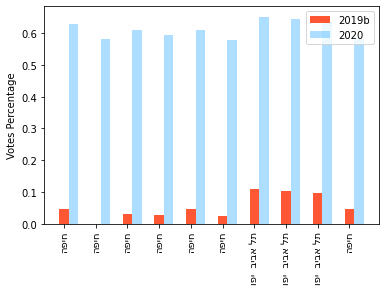

In [ ]:
plot_bars(values_2019b, values_2020, "2019b", "2020")

 <div dir="rtl">

בתרשים זה מוצגות קלפיות בהן אחוז ההצבעה לכחול לבן נמוך יותר ב-2020 מאשר במערכה הקודמת.


</div>

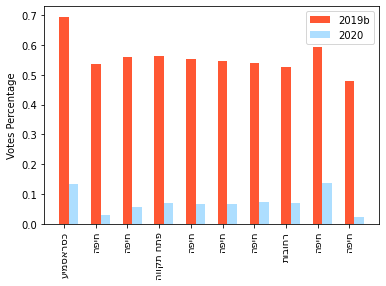

In [ ]:
plot_bars(values_2019b_2, values_2020_2, "2019b", "2020")

 <div dir="rtl">

הסברים אפשריים להבדלים הקיצוניים באחוזי ההצבעה לכחול לבן:

* קלפיות בחיפה: כנראה המיספור שלהן שונה בין 2 המערכות, מכיוון שהן מופיעות ב-2 התרשימים ואחוזי ההצבעה שלהן הם סימטרים.

* קלפיות בתל אביב: במערכת 2020 קלפיות אלה תמכו בכחול לבן יותר לעומת המערכה הקודמת. ידוע שבתל אביב התמיכה בכחול לבן היא גבוהה מלכתחילה, ולכן ניתן לשער שעקב רצון של הבוחרים להגיע להכרעה הם עברו ממפלגות קטנות יותר (כגון המחנה הדמוקרטי) למפלגת כחול לבן (כפי שאגב ראינו מקודם בשיערוך למעבר קולות).

בכל מקרה החלטתי להתמקד בהבדל הגבוה באחוז ההצבעה בקלפי בישוב "כסרא-סמיע".

</div>

 <div dir="rtl">

**איפון הישוב "כסרא-סמיע"**:

מתברר שכסרא-סמיע היא מועצה מקומית קטנה בגליל העליון, שמורכבת מהכפר כסרא ומהכפר סמיע.

 

</div>

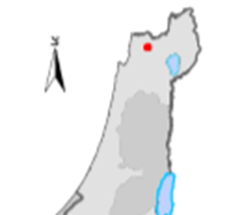

 <div dir="rtl">

לאחר חיפוש קצר בגוגל, מתברר שהיה בישוב זה חשד לזיופי קולות במערכת בחירות 2019a. 

</div>

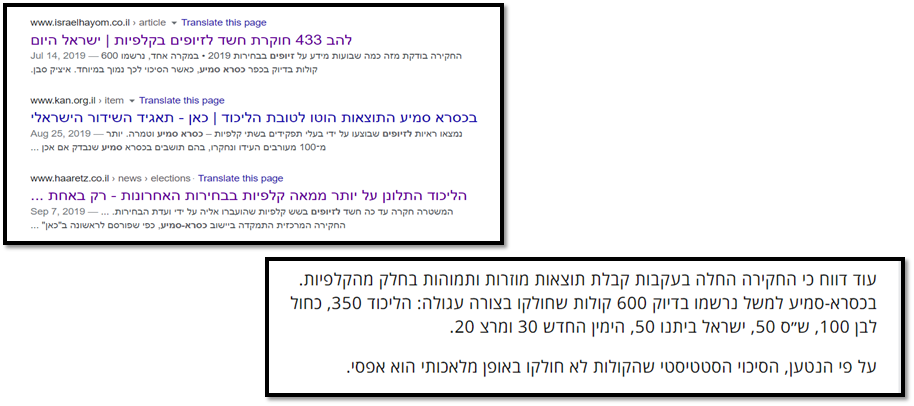

 <div dir="rtl">

כדי לבדוק האם גם הפעם יש עילה לבדיקה, בתרשים למטה הצגתי את נתוני ההצבעה בישוב זה בכל שלושת מערכות הבחירות.
</div>

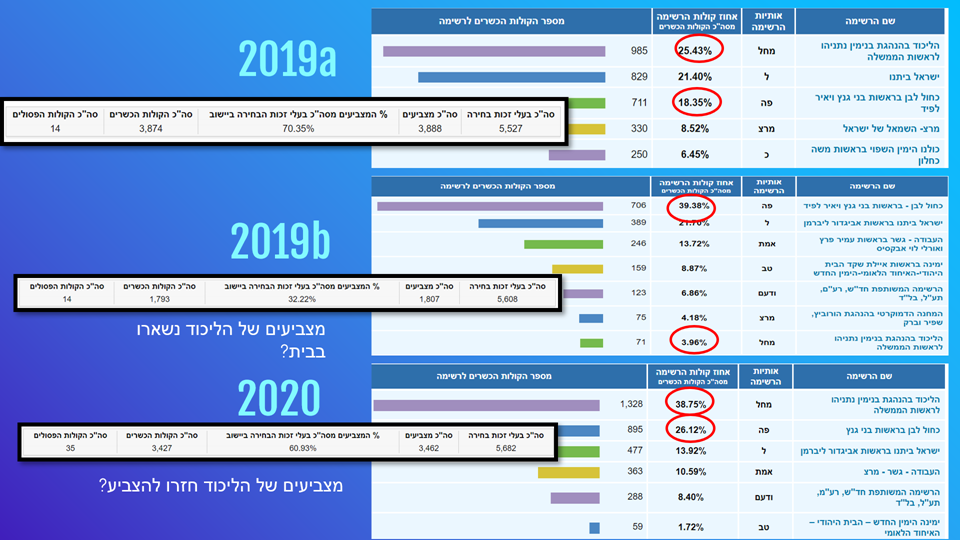

 <div dir="rtl">

  ניתן לראות דפוסי הצבעה קצת מוזרים:

לליכוד הצביעו 985 מצביעים ב-2019a, 
הצביעו 71 ב-2019b והצביעו 1328 ב-2020.

כלומר במערכת הבחירות השנייה הצביעו מעט בוחרים לליכוד לעומת מערכת הבחירות הראשונה והשנייה, וזה מתבטא גם באחוזי ההצבעה - במערכת הראשונה והשלישית הצביעו כ-3000 בוחרים לעומת כ-1000 בוחרים במערכת השנייה. הסבר אפשרי הוא שמצביעי הליכוד  לא באו להצביע במערכת הבחירות השנייה.

לעומת זאת כחול לבן נשארת יציבה (מקבלת בין 700 ל-900). 

אם כן ניתן להסיק שאחוז ההצבעה של כחול לבן משתנה עקב המצביעים של הליכוד - במערכת השנייה הם לא באו להצביע ולכן אחוז ההצבעה לכחול לבן היה גבוה, ובמערכת השלישית מצביעי הליכוד חזרו להצביע ולכן אחוז ההצבעה לכחול לבן ירד.



</div>